# Datasets loading and preprocessing

In [180]:
import pandas as pd
import os


folder_path="2015-citibike-tripdata"

files = [
    os.path.join(dirpath, file)
    for dirpath, _, filenames in os.walk(folder_path)
    for file in filenames if file.endswith(".csv") and file != ".DS_Store"
]
 
print(files)
print(f"Number of .csv files found: {len(files)}")
dataframes = []

for file_path in files: 
    df = pd.read_csv(file_path)
    dataframes.append(df)

fifteen_df = pd.concat(dataframes, ignore_index=True)

print(fifteen_df.head())
print(fifteen_df.info())

print(fifteen_df.tail(15))
print(len(fifteen_df))


['2015-citibike-tripdata\\10_October\\201510-citibike-tripdata_1.csv', '2015-citibike-tripdata\\10_October\\201510-citibike-tripdata_2.csv', '2015-citibike-tripdata\\11_November\\201511-citibike-tripdata_1.csv', '2015-citibike-tripdata\\12_December\\201512-citibike-tripdata_1.csv', '2015-citibike-tripdata\\1_January\\201501-citibike-tripdata_1.csv', '2015-citibike-tripdata\\2_February\\201502-citibike-tripdata_1.csv', '2015-citibike-tripdata\\3_March\\201503-citibike-tripdata_1.csv', '2015-citibike-tripdata\\4_April\\201504-citibike-tripdata_1.csv', '2015-citibike-tripdata\\5_May\\201505-citibike-tripdata_1.csv', '2015-citibike-tripdata\\6_June\\201506-citibike-tripdata_1.csv', '2015-citibike-tripdata\\7_July\\201507-citibike-tripdata_1.csv', '2015-citibike-tripdata\\7_July\\201507-citibike-tripdata_2.csv', '2015-citibike-tripdata\\8_August\\201508-citibike-tripdata_1.csv', '2015-citibike-tripdata\\8_August\\201508-citibike-tripdata_2.csv', '2015-citibike-tripdata\\9_September\\201509-

In [181]:
print(fifteen_df.isnull().sum())
birth_year_counts=fifteen_df["birth year"].value_counts()
print(birth_year_counts)

tripduration                     0
starttime                        0
stoptime                         0
start station id                 0
start station name               0
start station latitude           0
start station longitude          0
end station id                   0
end station name                 0
end station latitude             0
end station longitude            0
bikeid                           0
usertype                         0
birth year                 1311378
gender                           0
dtype: int64
birth year
1985.0    357916
1984.0    355731
1983.0    353397
1986.0    337001
1987.0    330548
           ...  
1931.0        14
1920.0         9
1927.0         7
1921.0         4
1929.0         1
Name: count, Length: 87, dtype: int64


In [182]:
cleaned_fifteen_df=fifteen_df.dropna(subset=["birth year"])

print(cleaned_fifteen_df.head(2))
print(cleaned_fifteen_df.isnull().sum())
print(cleaned_fifteen_df)

   tripduration           starttime            stoptime  start station id  \
0           171  10/1/2015 00:00:02  10/1/2015 00:02:54               388   
1           593  10/1/2015 00:00:02  10/1/2015 00:09:55               518   

  start station name  start station latitude  start station longitude  \
0   W 26 St & 10 Ave               40.749718               -74.002950   
1    E 39 St & 2 Ave               40.747804               -73.973442   

   end station id     end station name  end station latitude  \
0             494      W 26 St & 8 Ave             40.747348   
1             438  St Marks Pl & 1 Ave             40.727791   

   end station longitude  bikeid    usertype  birth year  gender  
0             -73.997236   24302  Subscriber      1973.0       1  
1             -73.985649   19904  Subscriber      1990.0       1  
tripduration               0
starttime                  0
stoptime                   0
start station id           0
start station name         0
start sta

### 1. Write a function named countTrips. It will take a pandas bike trips history dataframe as its input. The function should return an integer indicating the number of trips that are contained in the dataframe.

In [183]:
def countTrips(fifteen_df):
    return len(fifteen_df)

no_of_trips=countTrips(fifteen_df)
print("Total no of trips in the year 2015 are", no_of_trips)

Total no of trips in the year 2015 are 9937969


This output provides the total number of trips in the dataset, calculated by counting the rows, where each row represents one trip.

### 2. Write a function named avgTripDuration that will return the average trip duration (in seconds) for a given pandas bike trips history dataframe.

In [184]:
def avgTripDuration(fifteen_df):
    return fifteen_df["tripduration"].mean()

avg_trip_duration=avgTripDuration(fifteen_df)
print("Average duration of the trip(sec) in the year 2015 is", round(avg_trip_duration,2))

Average duration of the trip(sec) in the year 2015 is 968.09


This output shows the average duration of all trips (in seconds), giving an overview of typical trip lengths in the dataset.

### 3. Write a function named maxTripDuration that will return the maximum trip duration (in seconds) for annual members who were born on or after a given (input) year.

This function will take two inputs, in this order
▪
A 4-digit integer year (e.g., 19 d
▪
A pandas bike trips history dataframe.

In [185]:
def maxTripDuration(year,cleaned_fifteen_df):
    filtered_data= cleaned_fifteen_df[(cleaned_fifteen_df["birth year"]>=year) & (cleaned_fifteen_df["usertype"]=="Subscriber")]
    return filtered_data["tripduration"].max()

max_trip_duration=maxTripDuration(1983,cleaned_fifteen_df)
print("Maximum Trip duration from the year 1983 by annual member is",max_trip_duration,"seconds")

Maximum Trip duration from the year 1983 by annual member is 5864661 seconds


This output displays the maximum trip duration (in seconds) for annual members born on or after the specified year. It filters data by birth year to focus on a subset of users

### 4. Write a function named countAllStations that will return the number of unique stations (across both start and end stations) in a given bike trips history dataframe.

In [186]:
def countAllStations(fifteen_df):
    distinct_stations=set(fifteen_df["start station name"]).union(set(fifteen_df["end station name"]))
    return len(distinct_stations)

unique_stations=countAllStations(fifteen_df)
print("Unique stations across start and end stations are", unique_stations)

Unique stations across start and end stations are 507


This output indicates the total number of unique stations across both start and end locations in the dataset, helping to determine the coverage of the Citibike network.

### 5. Write a function named avgTripsByDayOfWeek that will return a 7-element list containing the average number of trips taken on each day of the week. The first element of the list should represent the average number of trips taken on Sundays; the last (7th) element of the list should represent the average number of trips taken on Saturdays. The function will have one input: a given pandas bike trips history dataframe.

In [187]:
import pandas as pd

def avgTripsByDayOfWeek(tp):
   
    tp['starttime'] = pd.to_datetime(tp['starttime'], errors='coerce')
    tp['day_of_week'] = tp['starttime'].dt.dayofweek
    tp['day_of_week'] = (tp['day_of_week'] + 1) % 7
    trips_by_day = tp.groupby('day_of_week').size()
    unique_days = tp.groupby('day_of_week')['starttime'].apply(lambda x: x.dt.date.nunique())
    avg_trips_by_day = trips_by_day / unique_days
    avg_trips_by_day = avg_trips_by_day.reindex(range(7), fill_value=0)
    avg_trips_reordered = avg_trips_by_day.tolist()
    return avg_trips_reordered

    
avgTripsByDayOfWeek(fifteen_df)

[27730.14285714286,
 35225.85294117647,
 35954.67647058824,
 35966.083333333336,
 34965.444444444445,
 34955.71428571428,
 28707.542857142857]

This output lists the average number of trips taken on each day of the week, starting with Sunday. It highlights usage patterns across different weekdays.

### 6. Write a function named topXdepartures that will find the x stations that have the most departures, sorted in descending order. If there are ties, include those as well. For example, your function may be asked to find the 10 stations with the most departure; if there is a 3-way tie for 10th place, then your function should return 12 stations. Your function should return a pandas dataframe containing three columns:rank, start station id, number of departures

In [188]:
def topXdepartures(x,fifteen_df):
    departures=pd.DataFrame(fifteen_df['start station id'].value_counts().reset_index())
    departures.columns= ["start station id", "no_of_departures"]
    departures["rank"]=departures["no_of_departures"].rank(method="dense",ascending=False).astype(int)
    top_x_departures=departures[departures["rank"]<=x]
    return top_x_departures

result= topXdepartures(10,fifteen_df)
print(result)

   start station id  no_of_departures  rank
0               519            104813     1
1               521            100796     2
2               293             95890     3
3               435             87149     4
4               497             86108     5
5               426             79061     6
6               285             73682     7
7               151             70374     8
8               284             67950     9
9               402             67497    10


This output returns the top stations with the highest number of departures, ranked in descending order. It includes ties and provides station IDs and departure counts for further analysis.

In [189]:
import pandas as pd
import os

folder_path = "2023-citibike-tripdata"
dataframes = []

for subfolder in os.listdir(folder_path):
    subfolder_path = os.path.join(folder_path, subfolder)

    if os.path.isdir(subfolder_path):
        files = sorted(os.listdir(subfolder_path))  
        if files: 
            first_file = files[0] 
            file_path = os.path.join(subfolder_path, first_file)
            if first_file.endswith(".csv"):
                df = pd.read_csv(file_path, low_memory=False)
                dataframes.append(df)

if dataframes:
    twentythree_df = pd.concat(dataframes, ignore_index=True)
    print(twentythree_df.head())
    print(twentythree_df.info())
else:
    print("No CSV files were successfully read.")

            ride_id  rideable_type               started_at  \
0  DC1CB984821DFFF7   classic_bike  2023-01-07 15:36:53.430   
1  C00CA02971557F16   classic_bike  2023-01-04 19:23:01.234   
2  C753AE5EBD8458F9   classic_bike  2023-01-20 09:22:19.894   
3  E4415A543C1972A7   classic_bike  2023-01-24 10:38:01.135   
4  BD52A87B215877C7  electric_bike  2023-01-13 10:17:38.192   

                  ended_at       start_station_name start_station_id  \
0  2023-01-07 15:39:45.406     Vesey St & Church St          5216.06   
1  2023-01-04 19:34:57.151  Lispenard St & Broadway          5391.06   
2  2023-01-20 10:23:24.255  3 Ave & Schermerhorn St          4437.01   
3  2023-01-24 10:41:40.749           E 5 St & Ave A          5626.06   
4  2023-01-13 10:33:59.099         W 54 St & 11 Ave          6955.05   

                end_station_name end_station_id  start_lat  start_lng  \
0       Albany St & Greenwich St        5145.02  40.712220 -74.010472   
1            St Marks Pl & 1 Ave        56

In [190]:
twentythree_df["started_at"]=pd.to_datetime(twentythree_df["started_at"])
twentythree_df["ended_at"]=pd.to_datetime(twentythree_df["ended_at"])

twentythree_df['start_station_id'] = twentythree_df['start_station_id'].astype(str)
twentythree_df['end_station_id'] = twentythree_df['end_station_id'].astype(str)

twentythree_df['start_station_id'] = twentythree_df['start_station_id'].str.replace(r'[^\d.]+', '', regex=True)
twentythree_df['end_station_id'] = twentythree_df['end_station_id'].str.replace(r'[^\d.]+', '', regex=True)

twentythree_df["start_station_id"]=pd.to_numeric(twentythree_df["start_station_id"],errors="coerce")
twentythree_df["end_station_id"]=pd.to_numeric(twentythree_df["end_station_id"],errors="coerce")

print("Datatypes after conversion:\n",twentythree_df.dtypes)

Datatypes after conversion:
 ride_id                       object
rideable_type                 object
started_at            datetime64[ns]
ended_at              datetime64[ns]
start_station_name            object
start_station_id             float64
end_station_name              object
end_station_id               float64
start_lat                    float64
start_lng                    float64
end_lat                      float64
end_lng                      float64
member_casual                 object
dtype: object


In [191]:
print(twentythree_df.isnull().sum())

ride_id                   0
rideable_type             0
started_at                0
ended_at                  0
start_station_name     5423
start_station_id       5438
end_station_name      48831
end_station_id        48847
start_lat                 0
start_lng                 0
end_lat               14004
end_lng               14004
member_casual             0
dtype: int64


In [192]:
columns_to_drop=["start_station_name","start_station_id","end_station_name","end_station_id","end_lat","end_lng"]

twentythree_df1=twentythree_df.dropna(subset=columns_to_drop)
print("Null values:\n", twentythree_df1.isnull().sum())


Null values:
 ride_id               0
rideable_type         0
started_at            0
ended_at              0
start_station_name    0
start_station_id      0
end_station_name      0
end_station_id        0
start_lat             0
start_lng             0
end_lat               0
end_lng               0
member_casual         0
dtype: int64


### 2. In 2023, what is the total number of trips taken, the average trips per day, the average duration per trip, and the percentage of trips taken by annual members?

In [193]:
no_of_trips= twentythree_df1["ride_id"].nunique()
avg_trips=twentythree_df1.groupby(twentythree_df1["started_at"].dt.date)["ride_id"].count().mean()
avg_duration= (twentythree_df1["ended_at"]-twentythree_df1["started_at"]).dt.total_seconds().mean()
annual_member_trips=twentythree_df1[twentythree_df1["member_casual"]=="member"].shape[0]
tripsby_annual=(annual_member_trips/no_of_trips)*100

print("Total number of trips taken are", no_of_trips)
print("The average trips per day",avg_trips)
print("The average duration per trip in seconds is", avg_duration)
print("The percentage of trips taken by annual members is", round(tripsby_annual,2))

Total number of trips taken are 11949416
The average trips per day 31780.36170212766
The average duration per trip in seconds is 833.0292201197111
The percentage of trips taken by annual members is 81.9


This output details the total number of trips in 2023, average trips per day, average trip duration, and the percentage of trips by annual members. These metrics highlight user behavior trends for the year.

### 3. Based on 2023 trip records, create plots showing the total number of trips taken in: 1) each month of the year, 2) each day of the week, and 3) each hour of the day. 

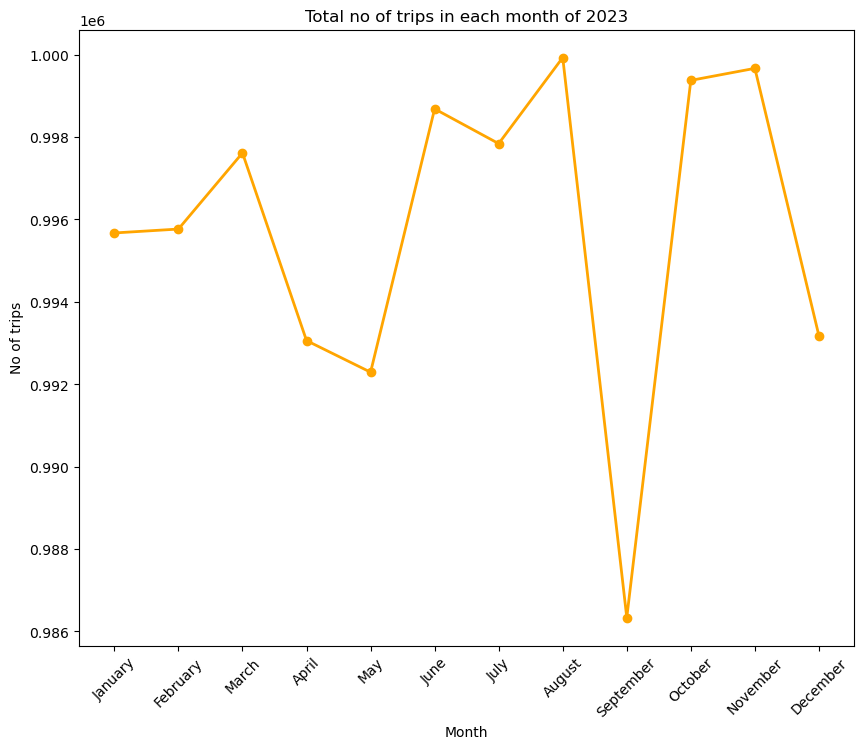

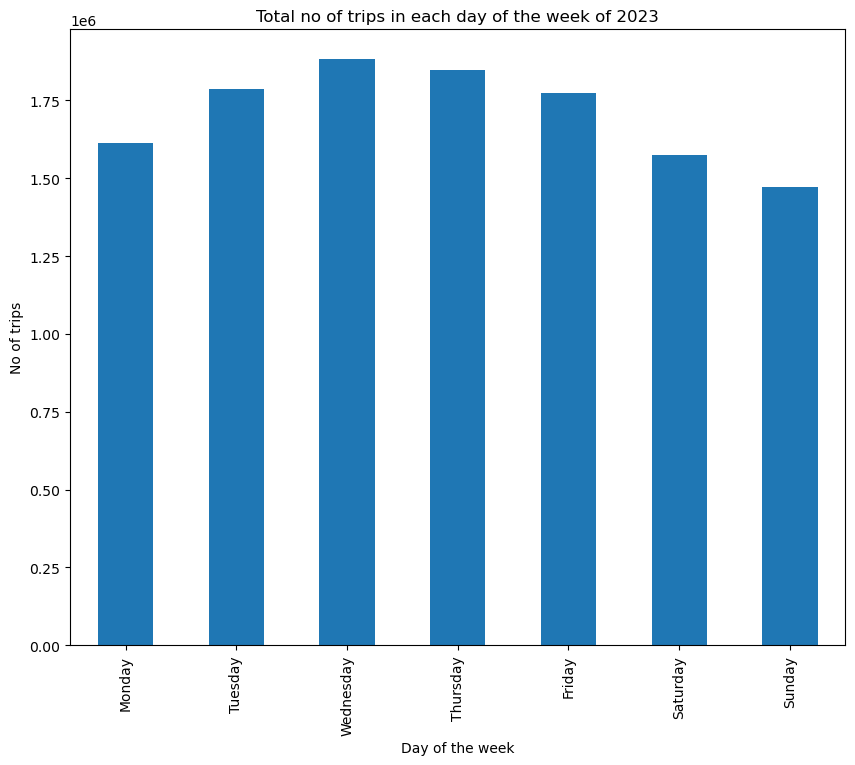

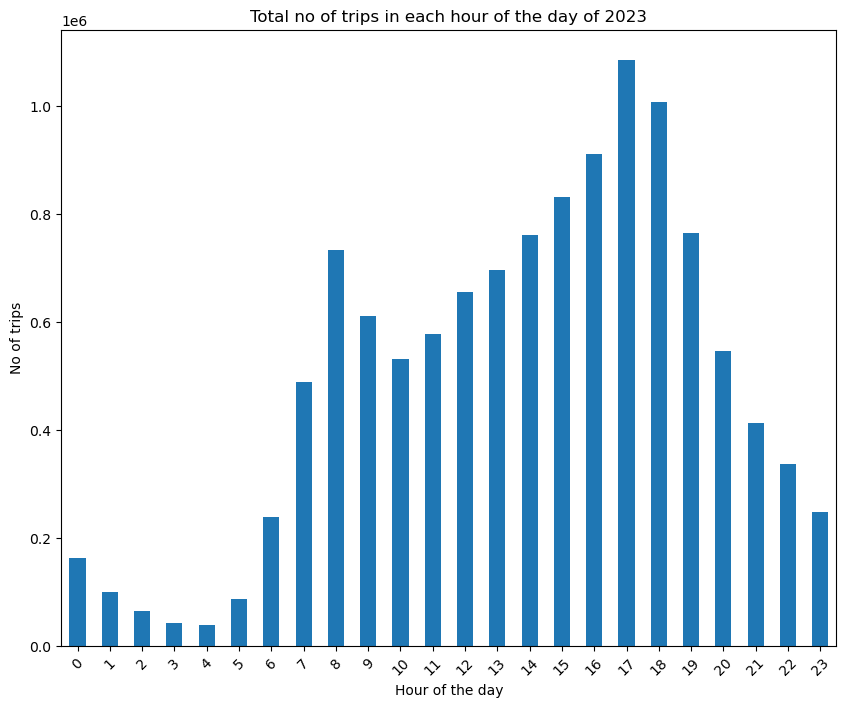

In [194]:
import matplotlib.pyplot as plt

monthly_trips=twentythree_df1.groupby(twentythree_df1["started_at"].dt.month)["ride_id"].count()
month_names=["January", "February", "March", "April", "May", "June",
    "July", "August", "September", "October", "November", "December"]

plt.figure(figsize=(10,8))
plt.plot(month_names, monthly_trips, marker='o', color='orange', linewidth=2)
plt.title("Total no of trips in each month of 2023")
plt.xlabel("Month")
plt.ylabel("No of trips")
plt.xticks(ticks=range(12), labels=month_names, rotation=45)
plt.show()

day_week_trends=twentythree_df1.groupby(twentythree_df1["started_at"].dt.day_name())["ride_id"].count()

plt.figure(figsize=(10,8))
day_week_trends.reindex(["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]).plot(kind='bar')
plt.title("Total no of trips in each day of the week of 2023")
plt.xlabel("Day of the week")
plt.ylabel("No of trips")
plt.show()

hourly_trends=twentythree_df1.groupby(twentythree_df1["started_at"].dt.hour)["ride_id"].count()

plt.figure(figsize=(10,8))
hourly_trends.plot(kind='bar')
plt.title("Total no of trips in each hour of the day of 2023")
plt.xlabel("Hour of the day")
plt.ylabel("No of trips")
plt.xticks(range(0,24), rotation=45)
plt.show()

The plots illustrate trip volume variations by month, day of the week, and hour of the day, providing a visual representation of peak usage times and patterns.

### 4. Find the top 10 most popular stations and top 10 most common bike trip routes in 2023. Show the results using bar charts. 

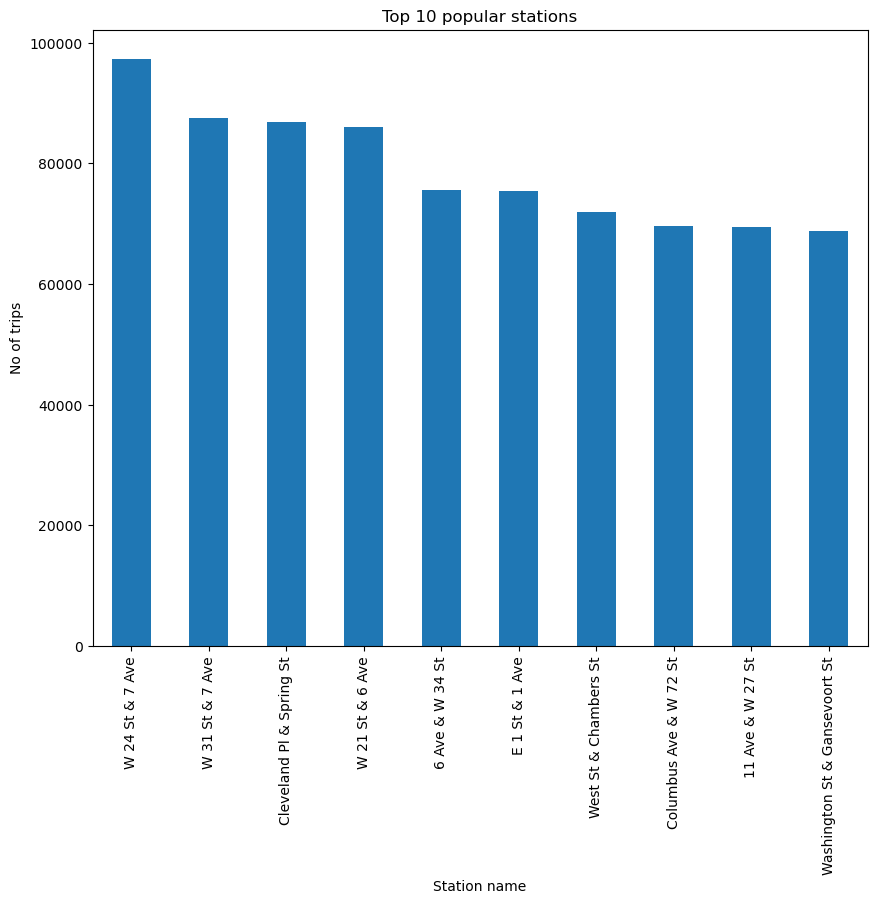

C:\Users\boppa\AppData\Local\Temp\ipykernel_5272\2541906604.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  twentythree_df1["routes"]=twentythree_df1["start_station_name"]+" to "+twentythree_df1["end_station_name"]


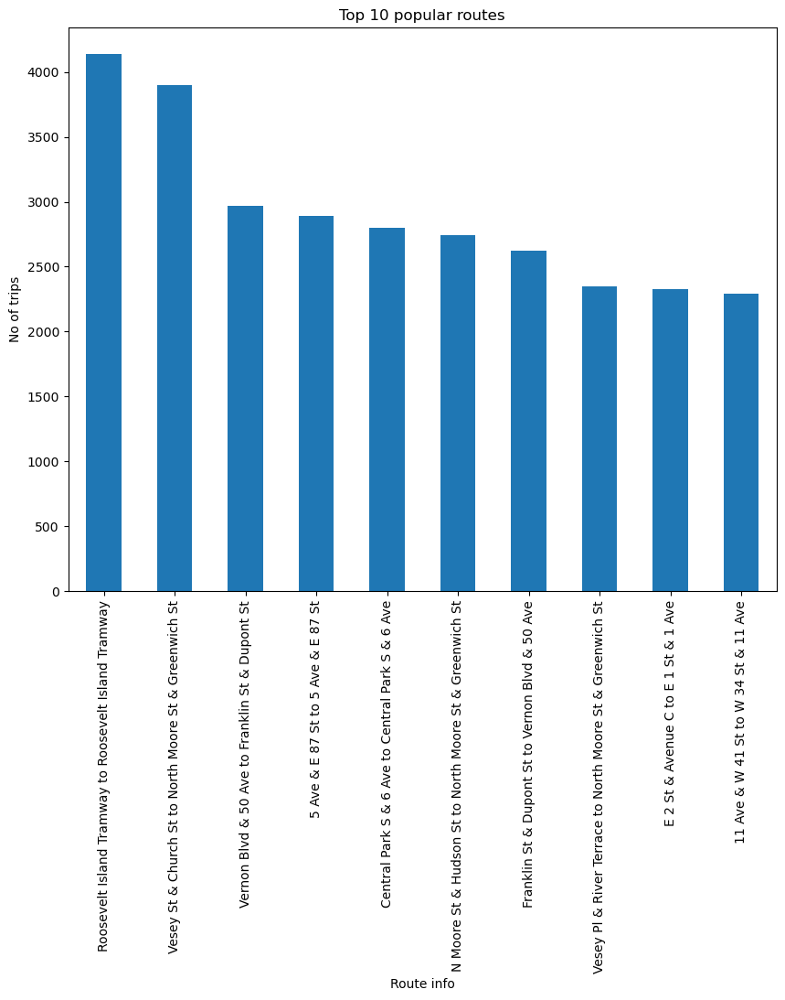

In [195]:
popular_stations=twentythree_df1["start_station_name"].value_counts()+twentythree_df1["end_station_name"].value_counts()
top10_stations=popular_stations.nlargest(10)

plt.figure(figsize=(10,8))
top10_stations.plot(kind='bar')
plt.title("Top 10 popular stations")
plt.xlabel("Station name")
plt.ylabel("No of trips")
plt.show()

twentythree_df1["routes"]=twentythree_df1["start_station_name"]+" to "+twentythree_df1["end_station_name"]
top10_routes=twentythree_df1["routes"].value_counts().nlargest(10)

plt.figure(figsize=(10,8))
top10_routes.plot(kind='bar')
plt.title("Top 10 popular routes")
plt.xlabel("Route info")
plt.ylabel("No of trips")
plt.show()


These bar charts identify the most frequented stations and trip routes in 2023, helping to pinpoint hotspots of activity within the network.

### 5. Create a heatmap depicting the average usage of the top bike station identified in the last question at different times of the day. 

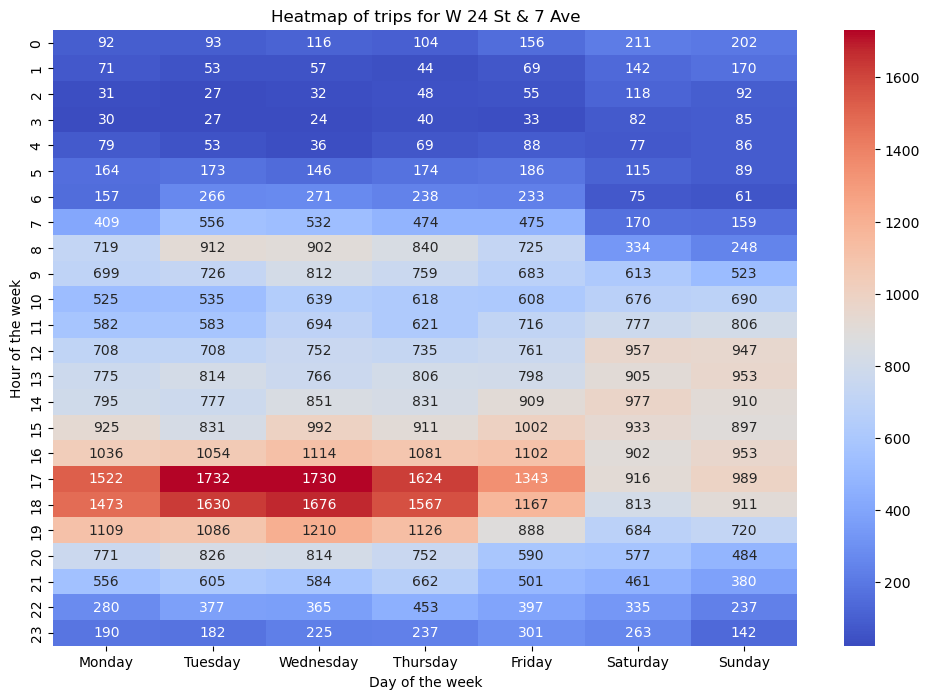

In [196]:
import seaborn as sns

top_station= top10_stations.idxmax()
station_data=twentythree_df1[(twentythree_df1["start_station_name"]== top_station) | (twentythree_df1["end_station_name"]==top_station)]
heatmap_data=station_data.groupby([station_data["started_at"].dt.hour, station_data["started_at"].dt.day_name()])["ride_id"].count().unstack()
heatmap_data=heatmap_data.reindex(columns=["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"])


plt.figure(figsize=(12,8))
sns.heatmap(heatmap_data,cmap="coolwarm", annot=True, fmt="d")
plt.title(f'Heatmap of trips for {top_station}')
plt.xlabel("Day of the week")
plt.ylabel("Hour of the week")
plt.show()


This heatmap visualizes the average hourly usage of the top station, offering insights into its demand throughout the day.

### 6. Is there a relationship between trip duration and the distance between the start and end stations? Present your results visually.

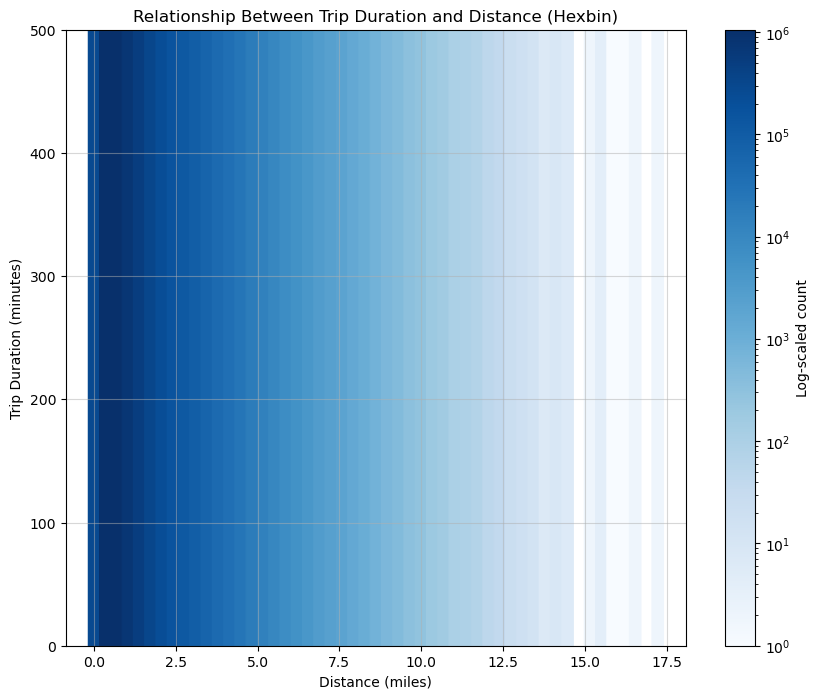

In [197]:
from math import radians, cos, sin, sqrt, atan2

def haversine(lat1, lon1, lat2, lon2):
    R = 3958.76  
    dlat = radians(lat2 - lat1)
    dlon = radians(lon2 - lon1)
    a = sin(dlat/2) ** 2 + cos(radians(lat1)) * cos(radians(lat2)) * sin(dlon/2) ** 2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))
    return R * c 

subset_data= twentythree_df1.sample(frac=0.4,random_state=45)

subset_data.loc[:,'distance'] = subset_data.apply(lambda x: haversine(x['start_lat'], x['start_lng'], x['end_lat'], x['end_lng']), axis=1)
subset_data.loc[:,'trip_duration'] = (subset_data['ended_at'] - subset_data['started_at']).dt.total_seconds() / 60

plt.figure(figsize=(10, 8))
hexbin_plot=plt.hexbin(
    subset_data['distance'], 
    subset_data['trip_duration'], 
    gridsize=50, 
    cmap='Blues', 
    bins='log'
)
plt.colorbar(hexbin_plot,label='Log-scaled count')
plt.title('Relationship Between Trip Duration and Distance (Hexbin)')
plt.xlabel('Distance (miles)')
plt.ylabel('Trip Duration (minutes)')
plt.ylim(0,500)
plt.grid(alpha=0.5)
plt.show()

The plot examines the relationship between trip duration and start-end station distances, helping to understand user travel behaviors.

### 7. Plot the usage (total number of trips) of all stations on a map of NYC. Consider using different colors or dot sizes to represent the usage levels.

In [198]:
import pandas as pd
import folium
from IPython.display import IFrame

station_usage = twentythree_df1.groupby(['start_station_name', 'start_lat', 'start_lng']).size().reset_index(name='total_trips')

bins = [0, 10000, 15000, 20000, 25000, 30000]  # Customize based on your data
labels = ['Low', 'Medium', 'High', 'Very High', 'Extreme']
station_usage['usage_level'] = pd.cut(station_usage['total_trips'], bins=bins, labels=labels, right=False)
color_mapping = {
    'Low': 'green',
    'Medium': 'blue',
    'High': 'orange',
    'Very High': 'purple',
    'Extreme': 'red'
}

station_usage['color'] = station_usage['usage_level'].map(color_mapping)
top_stations = station_usage.nlargest(500, 'total_trips')

nyc_map = folium.Map(location=[40.7128, -74.0060], zoom_start=12)

for _, row in top_stations.iterrows():
    folium.CircleMarker(
        location=(row['start_lat'], row['start_lng']),
        radius=5,  
        color=row['color'],  
        fill=True,
        fill_color=row['color'],
        fill_opacity=0.6,
        tooltip=f"Station: {row['start_station_name']}<br>Total Trips: {row['total_trips']}<br>Usage Level: {row['usage_level']}"
    ).add_to(nyc_map)

nyc_map


This map visualizes the total number of trips originating from each station across NYC. Different colors or dot sizes represent varying levels of station usage, allowing for quick identification of high and low-demand areas.

# Task 2: Real-Time Data Analysis


### 1. Import the station status data from station status link and the station information data from station information link. These JSON files are part of the "General Bikeshare Feed Specification" and provide real-time records of station status. Create dataframes to store the current station status and station information. 

In [199]:
import pandas as pd
import requests

station_info_url = 'https://gbfs.lyft.com/gbfs/2.3/bkn/es/station_information.json'
station_status_url = 'https://gbfs.lyft.com/gbfs/2.3/bkn/es/station_status.json'

station_info_response = requests.get(station_info_url)
station_status_response = requests.get(station_status_url)

station_info = pd.json_normalize(station_info_response.json()['data']['stations'])
station_status = pd.json_normalize(station_status_response.json()['data']['stations'])

In [200]:
station_info.columns

Index(['lat', 'region_id', 'name', 'capacity', 'station_id', 'short_name',
       'lon', 'rental_uris.android', 'rental_uris.ios'],
      dtype='object')

In [201]:
station_status.columns

Index(['vehicle_types_available', 'num_docks_disabled', 'num_bikes_available',
       'is_returning', 'last_reported', 'num_docks_available', 'station_id',
       'num_ebikes_available', 'is_installed', 'num_bikes_disabled',
       'is_renting', 'num_scooters_unavailable', 'num_scooters_available'],
      dtype='object')

## Task 1

### 1. As of August 2024, how many active stations are currently in service (i.e., have recorded trips starting or ending at them), and how many bikes are in service in total?

In [202]:
active_stations = station_status[
    (station_status['is_renting'] == 1) & 
    (station_status['is_returning'] == 1) & 
    (station_status['is_installed'] == 1)
]
num_active_stations = active_stations.shape[0]

In [203]:
total_bikes_in_service = active_stations['num_bikes_available'].sum()
print(f"As of August 2024, there are {num_active_stations} active stations and {total_bikes_in_service} bikes in service.")

As of August 2024, there are 2206 active stations and 35825 bikes in service.


This output shows the number of active stations and bikes in service as of August 2024, providing insight into the current scale of Citibike operations.

### 2. Merge the two dataframes using a common identifier, and visualize the number of available bikes based on the geographical areas provided in the station information data. 

In [204]:
merged_df = pd.merge(station_info, station_status, on='station_id')
merged_df

,lat,region_id,name,capacity,station_id,short_name,lon,rental_uris.android,rental_uris.ios,vehicle_types_available,...,num_bikes_available,is_returning,last_reported,num_docks_available,num_ebikes_available,is_installed,num_bikes_disabled,is_renting,num_scooters_unavailable,num_scooters_available
0,40.638196,71,6 Ave & 60 St,22,0bd9bd58-42e6-4680-9d19-83943372221f,2912.08,-74.013821,https://bkn.lft.to/lastmile_qr_scan,https://bkn.lft.to/lastmile_qr_scan,"[{'count': 0, 'vehicle_type_id': '1'}, {'count...",...,0,0,1729514620,0,0,0,0,0,NaN,NaN
1,40.642703,71,52 St & 6 Ave,19,816e50eb-dc4b-47dc-b773-154e2020cb0d,3084.05,-74.009441,https://bkn.lft.to/lastmile_qr_scan,https://bkn.lft.to/lastmile_qr_scan,"[{'count': 0, 'vehicle_type_id': '1'}, {'count...",...,0,0,1730827344,0,0,0,0,0,NaN,NaN
2,40.642408,71,55 St & 5 Ave,3,566a6389-5c22-49ca-8c24-4d9eea135170,3050.03,-74.013318,https://bkn.lft.to/lastmile_qr_scan,https://bkn.lft.to/lastmile_qr_scan,"[{'count': 0, 'vehicle_type_id': '1'}, {'count...",...,0,0,1731339673,0,0,0,0,0,NaN,NaN
3,40.725570,71,Nassau Ave & Russell St,51,66dd1c7f-0aca-11e7-82f6-3863bb44ef7c,5581.01,-73.944340,https://bkn.lft.to/lastmile_qr_scan,https://bkn.lft.to/lastmile_qr_scan,"[{'count': 14, 'vehicle_type_id': '1'}, {'coun...",...,22,1,1733888433,25,8,1,3,1,0.0,0.0
4,40.663779,71,14 St & 7 Ave,24,66ddec3e-0aca-11e7-82f6-3863bb44ef7c,3731.11,-73.983968,https://bkn.lft.to/lastmile_qr_scan,https://bkn.lft.to/lastmile_qr_scan,"[{'count': 2, 'vehicle_type_id': '1'}, {'count...",...,5,1,1733888433,19,3,1,0,1,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2226,40.721124,70,Warren St,22,66dd5a42-0aca-11e7-82f6-3863bb44ef7c,JC006,-74.038051,https://bkn.lft.to/lastmile_qr_scan,https://bkn.lft.to/lastmile_qr_scan,"[{'count': 18, 'vehicle_type_id': '1'}, {'coun...",...,20,1,1733888440,0,2,1,2,1,0.0,0.0
2227,40.718355,70,Columbus Drive,14,66dddc08-0aca-11e7-82f6-3863bb44ef7c,JC014,-74.038914,https://bkn.lft.to/lastmile_qr_scan,https://bkn.lft.to/lastmile_qr_scan,"[{'count': 3, 'vehicle_type_id': '1'}, {'count...",...,10,1,1733888342,2,7,1,2,1,0.0,0.0
2228,40.711242,70,Liberty Light Rail,22,66dd5f24-0aca-11e7-82f6-3863bb44ef7c,JC052,-74.055701,https://bkn.lft.to/lastmile_qr_scan,https://bkn.lft.to/lastmile_qr_scan,"[{'count': 4, 'vehicle_type_id': '1'}, {'count...",...,15,1,1733888348,1,11,1,6,1,0.0,0.0
2229,40.726012,70,Brunswick & 6th,14,66ddd8a8-0aca-11e7-82f6-3863bb44ef7c,JC081,-74.050389,https://bkn.lft.to/lastmile_qr_scan,https://bkn.lft.to/lastmile_qr_scan,"[{'count': 3, 'vehicle_type_id': '1'}, {'count...",...,10,1,1733888441,4,7,1,0,1,0.0,0.0


In [205]:
merged_df.columns

Index(['lat', 'region_id', 'name', 'capacity', 'station_id', 'short_name',
       'lon', 'rental_uris.android', 'rental_uris.ios',
       'vehicle_types_available', 'num_docks_disabled', 'num_bikes_available',
       'is_returning', 'last_reported', 'num_docks_available',
       'num_ebikes_available', 'is_installed', 'num_bikes_disabled',
       'is_renting', 'num_scooters_unavailable', 'num_scooters_available'],
      dtype='object')

            lat region_id                     name  capacity  \
0     40.638196        71            6 Ave & 60 St        22   
1     40.642703        71            52 St & 6 Ave        19   
2     40.642408        71            55 St & 5 Ave         3   
3     40.725570        71  Nassau Ave & Russell St        51   
4     40.663779        71            14 St & 7 Ave        24   
...         ...       ...                      ...       ...   
2226  40.721124        70                Warren St        22   
2227  40.718355        70           Columbus Drive        14   
2228  40.711242        70       Liberty Light Rail        22   
2229  40.726012        70          Brunswick & 6th        14   
2230  40.750604       311     12 St & Sinatra Dr N        28   

                                station_id short_name        lon  \
0     0bd9bd58-42e6-4680-9d19-83943372221f    2912.08 -74.013821   
1     816e50eb-dc4b-47dc-b773-154e2020cb0d    3084.05 -74.009441   
2     566a6389-5c22-49ca-8c

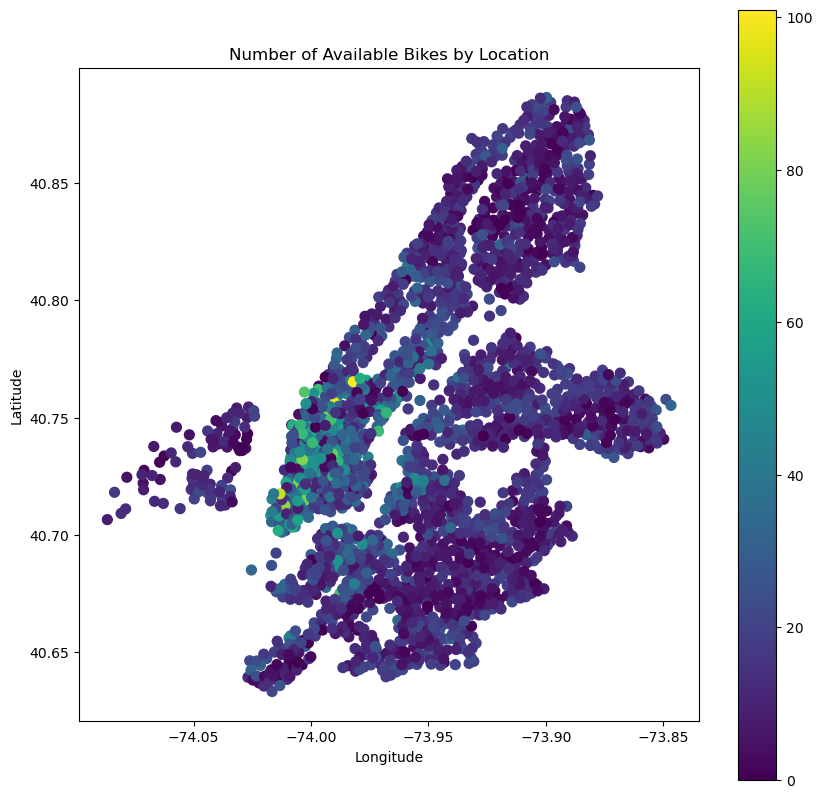

In [206]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point

geometry = [Point(xy) for xy in zip(merged_df['lon'], merged_df['lat'])]
geo_df = gpd.GeoDataFrame(merged_df, geometry=geometry)
print(geo_df)
# Plot
fig, ax = plt.subplots(figsize=(10, 10))
geo_df.plot(column='num_bikes_available', cmap='viridis', legend=True, markersize=50, ax=ax)
plt.title('Number of Available Bikes by Location')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [207]:
import folium
merged_df_folium = merged_df.copy()
merged_df_folium = pd.merge(
    station_info[['station_id', 'lat', 'lon', 'name']],  # Include required columns
    station_status,
    on='station_id'
)

map = folium.Map(location=[merged_df['lat'].mean(), merged_df['lon'].mean()], tiles="CartoDB Positron", zoom_start=12)

for _, row in merged_df.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=5,  # Marker size
        color='green',
        fill=True,
        fill_color='green',
        popup=f"Station: {row['name']}<br>Available Bikes: {row['num_bikes_available']}",
    ).add_to(map)

map

This map shows the distribution of available bikes across geographical regions, highlighting areas with high or low bike availability.

### 3. Determine the current utilization rate for each station by calculating the percentage of  bikes in use relative to the total capacity of each station. Display the utilization rate on a map.

In [208]:
merged_df['total_capacity'] = merged_df['num_bikes_available'] + merged_df['num_docks_available']
merged_df['utilization_rate'] = (merged_df['num_bikes_available'] / merged_df['total_capacity']) * 100
geo_df['utilization_rate'] = merged_df['utilization_rate']

In [209]:
merged_df_map = merged_df.copy()

merged_df_map = pd.merge(
    station_info[['station_id', 'lat', 'lon', 'name']],  # Include 'lat', 'lon', and 'name'
    station_status,
    on='station_id'
)
merged_df['total_capacity'] = merged_df['num_bikes_available'] + merged_df['num_docks_available']
merged_df['utilization_rate'] = (merged_df['num_bikes_available'] / merged_df['total_capacity']) * 100
map = folium.Map(location=[merged_df['lat'].mean(), merged_df['lon'].mean()], tiles="CartoDB Positron", zoom_start=12)

for _, row in merged_df.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=5,
        color='blue',
        fill=True,
        fill_color='red',
        popup=f"Station: {row['name']}<br>Utilization Rate: {row['utilization_rate']:.2f}%",
    ).add_to(map)

map

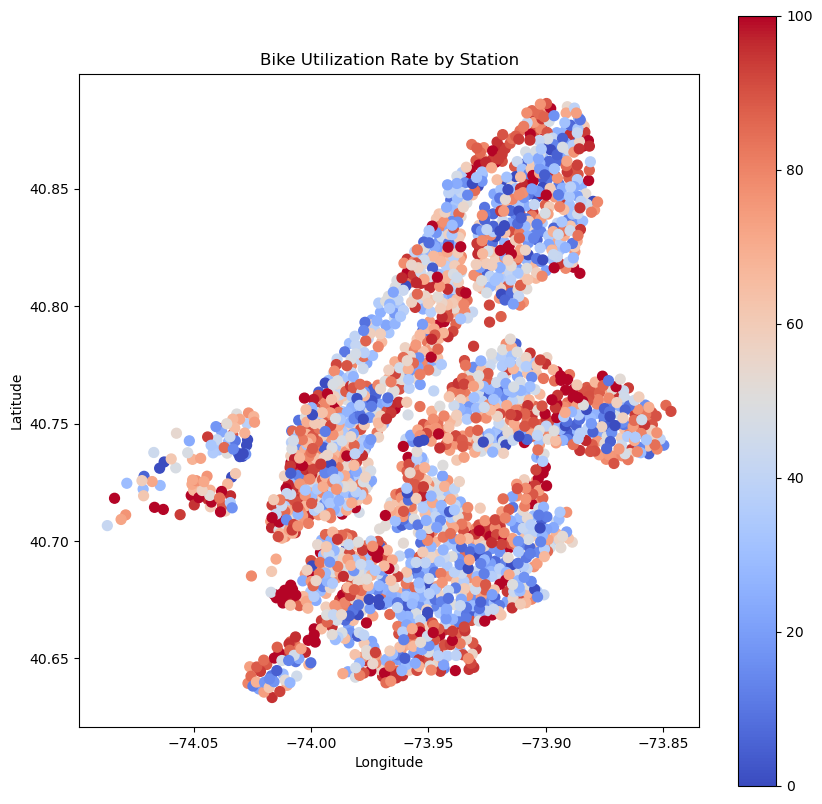

In [210]:
fig, ax = plt.subplots(figsize=(10, 10))

geo_df.plot(column='utilization_rate', cmap='coolwarm', legend=True, markersize=50, ax=ax)
plt.title('Bike Utilization Rate by Station')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


The map visualizes station utilization rates, depicting the percentage of bikes in use versus total station capacity.

### 4. Using the station information data, group the stations by neighborhood or area (region_id). Create a pivot table to show the total number of available bikes, available docks, and overall capacity for each neighborhood. Identify which neighborhood has the highest total bike availability and which has the highest total dock availability. 

In [211]:
pivot_table = merged_df.pivot_table(
    index="region_id",
    values=["num_bikes_available", "num_docks_available", "total_capacity"],
    aggfunc="sum"
).reset_index()

from IPython.display import display
display(pivot_table)

max_bikes_neighborhood = pivot_table.loc[pivot_table['num_bikes_available'].idxmax()]
max_docks_neighborhood = pivot_table.loc[pivot_table['num_docks_available'].idxmax()]

print("Neighborhood with highest total bike availability:", max_bikes_neighborhood)
print("Neighborhood with highest total dock availability:", max_docks_neighborhood)


,region_id,num_bikes_available,num_docks_available,total_capacity
0,311,220,319,539
1,70,600,366,966
2,71,34952,27966,62918


Neighborhood with highest total bike availability: region_id                 71
num_bikes_available    34952
num_docks_available    27966
total_capacity         62918
Name: 2, dtype: object
Neighborhood with highest total dock availability: region_id                 71
num_bikes_available    34952
num_docks_available    27966
total_capacity         62918
Name: 2, dtype: object


The pivot table summarizes bike and dock availability by neighborhood, identifying the regions with the highest bike and dock availability.

### 5. Calculate the total number of disabled docks and bikes across all stations. Create a summary table that includes the station information, total number of disabled docks, total number of disabled bikes, and the percentage of disabled bikes relative to the total bikes available at each station. 

In [212]:
merged_df['num_docks_disabled'] = merged_df.get('num_docks_disabled', 0)
merged_df['num_bikes_disabled'] = merged_df.get('num_bikes_disabled', 0)

total_disabled_docks = merged_df['num_docks_disabled'].sum()
total_disabled_bikes = merged_df['num_bikes_disabled'].sum()

merged_df['percent_disabled_bikes'] = merged_df.apply(
    lambda row: (row['num_bikes_disabled'] / row['num_bikes_available']) * 100
    if row['num_bikes_available'] > 0 else 0,
    axis=1
)

summary_table = merged_df[[
    'station_id', 'name', 'num_docks_disabled', 'num_bikes_disabled',
    'num_bikes_available', 'percent_disabled_bikes'
]]

print("Total Disabled Docks:", total_disabled_docks)
print("Total Disabled Bikes:", total_disabled_bikes)

from IPython.display import display
display(summary_table)


Total Disabled Docks: 153
Total Disabled Bikes: 3861


,station_id,name,num_docks_disabled,num_bikes_disabled,num_bikes_available,percent_disabled_bikes
0,0bd9bd58-42e6-4680-9d19-83943372221f,6 Ave & 60 St,0,0,0,0.000000
1,816e50eb-dc4b-47dc-b773-154e2020cb0d,52 St & 6 Ave,0,0,0,0.000000
2,566a6389-5c22-49ca-8c24-4d9eea135170,55 St & 5 Ave,3,0,0,0.000000
3,66dd1c7f-0aca-11e7-82f6-3863bb44ef7c,Nassau Ave & Russell St,0,3,22,13.636364
4,66ddec3e-0aca-11e7-82f6-3863bb44ef7c,14 St & 7 Ave,0,0,5,0.000000
...,...,...,...,...,...,...
2226,66dd5a42-0aca-11e7-82f6-3863bb44ef7c,Warren St,0,2,20,10.000000
2227,66dddc08-0aca-11e7-82f6-3863bb44ef7c,Columbus Drive,0,2,10,20.000000
2228,66dd5f24-0aca-11e7-82f6-3863bb44ef7c,Liberty Light Rail,0,6,15,40.000000
2229,66ddd8a8-0aca-11e7-82f6-3863bb44ef7c,Brunswick & 6th,0,0,10,0.000000


This summary table provides an overview of station information, highlighting the total number of disabled docks and bikes for each station. It also calculates the percentage of disabled bikes relative to the total available bikes, offering insights into station maintenance and operational efficiency.

### 6. Is there correlation between the number of disabled docks and bikes?  

In [213]:
correlation = merged_df[['num_docks_disabled', 'num_bikes_disabled']].corr().iloc[0, 1]
print(f"Correlation between disabled docks and bikes: {correlation}")

Correlation between disabled docks and bikes: -0.005443008117583118


This output evaluates the correlation between the number of disabled docks and disabled bikes across all stations. The analysis provides insights into whether maintenance issues affecting docks also impact bike functionality, helping identify patterns in operational challenges.

# Task 3


In [214]:
file_path = "data_for_task3/201310-citibike-tripdata_1.csv"
temp_data = pd.read_csv(file_path, low_memory=False)
print(temp_data.columns)

Index(['tripduration', 'starttime', 'stoptime', 'start station id',
       'start station name', 'start station latitude',
       'start station longitude', 'end station id', 'end station name',
       'end station latitude', 'end station longitude', 'bikeid', 'usertype',
       'birth year', 'gender'],
      dtype='object')


In [215]:
file_path = "data_for_task3/201410-citibike-tripdata_1.csv"
temp_data = pd.read_csv(file_path, low_memory=False)
print(temp_data.columns)

Index(['tripduration', 'starttime', 'stoptime', 'start station id',
       'start station name', 'start station latitude',
       'start station longitude', 'end station id', 'end station name',
       'end station latitude', 'end station longitude', 'bikeid', 'usertype',
       'birth year', 'gender'],
      dtype='object')


In [216]:
file_path = "data_for_task3/201510-citibike-tripdata_1.csv"
temp_data = pd.read_csv(file_path, low_memory=False)
print(temp_data.columns)

Index(['tripduration', 'starttime', 'stoptime', 'start station id',
       'start station name', 'start station latitude',
       'start station longitude', 'end station id', 'end station name',
       'end station latitude', 'end station longitude', 'bikeid', 'usertype',
       'birth year', 'gender'],
      dtype='object')


In [217]:
file_path = "data_for_task3/201610-citibike-tripdata_1.csv"
temp_data = pd.read_csv(file_path, low_memory=False)
print(temp_data.columns)

Index(['Trip Duration', 'Start Time', 'Stop Time', 'Start Station ID',
       'Start Station Name', 'Start Station Latitude',
       'Start Station Longitude', 'End Station ID', 'End Station Name',
       'End Station Latitude', 'End Station Longitude', 'Bike ID', 'User Type',
       'Birth Year', 'Gender'],
      dtype='object')


In [218]:
file_path = "data_for_task3/201710-citibike-tripdata_1.csv"
temp_data = pd.read_csv(file_path, low_memory=False)
print(temp_data.columns)

Index(['tripduration', 'starttime', 'stoptime', 'start station id',
       'start station name', 'start station latitude',
       'start station longitude', 'end station id', 'end station name',
       'end station latitude', 'end station longitude', 'bikeid', 'usertype',
       'birth year', 'gender'],
      dtype='object')


In [219]:
file_path = "data_for_task3/201810-citibike-tripdata_1.csv"
temp_data = pd.read_csv(file_path, low_memory=False)
print(temp_data.columns)

Index(['tripduration', 'starttime', 'stoptime', 'start station id',
       'start station name', 'start station latitude',
       'start station longitude', 'end station id', 'end station name',
       'end station latitude', 'end station longitude', 'bikeid', 'usertype',
       'birth year', 'gender'],
      dtype='object')


In [220]:
file_path = "data_for_task3/201910-citibike-tripdata_1.csv"
temp_data = pd.read_csv(file_path, low_memory=False)
print(temp_data.columns)

Index(['tripduration', 'starttime', 'stoptime', 'start station id',
       'start station name', 'start station latitude',
       'start station longitude', 'end station id', 'end station name',
       'end station latitude', 'end station longitude', 'bikeid', 'usertype',
       'birth year', 'gender'],
      dtype='object')


In [221]:
file_path = "data_for_task3/202010-citibike-tripdata_1.csv"
temp_data = pd.read_csv(file_path, low_memory=False)
print(temp_data.columns)

Index(['ride_id', 'rideable_type', 'started_at', 'ended_at',
       'start_station_name', 'start_station_id', 'end_station_name',
       'end_station_id', 'start_lat', 'start_lng', 'end_lat', 'end_lng',
       'member_casual'],
      dtype='object')


In [222]:
file_path = "data_for_task3/202110-citibike-tripdata_1.csv"
temp_data = pd.read_csv(file_path, low_memory=False)
print(temp_data.columns)

Index(['ride_id', 'rideable_type', 'started_at', 'ended_at',
       'start_station_name', 'start_station_id', 'end_station_name',
       'end_station_id', 'start_lat', 'start_lng', 'end_lat', 'end_lng',
       'member_casual'],
      dtype='object')


In [223]:
file_path = "data_for_task3/202210-citibike-tripdata_1.csv"
temp_data = pd.read_csv(file_path, low_memory=False)
print(temp_data.columns)

Index(['ride_id', 'rideable_type', 'started_at', 'ended_at',
       'start_station_name', 'start_station_id', 'end_station_name',
       'end_station_id', 'start_lat', 'start_lng', 'end_lat', 'end_lng',
       'member_casual'],
      dtype='object')


In [224]:
file_path = "data_for_task3/202310-citibike-tripdata_1.csv"
temp_data = pd.read_csv(file_path, low_memory=False)
print(temp_data.columns)

Index(['ride_id', 'rideable_type', 'started_at', 'ended_at',
       'start_station_name', 'start_station_id', 'end_station_name',
       'end_station_id', 'start_lat', 'start_lng', 'end_lat', 'end_lng',
       'member_casual'],
      dtype='object')


### 1.Load the trip data from 2013 to 2023

In [225]:
import pandas as pd
import glob

folder_path = "data_for_task3/"  # Replace the folder path
file_pattern = folder_path + "*-citibike-tripdata_1.csv"  # Match the pattern for the filenames
file_list = glob.glob(file_pattern)
all_data = pd.DataFrame()

relevant_columns = [
    "tripduration",
    "starttime",
    "stoptime",
    "start station id",
    "start station name",
    "start station latitude",
    "start station longitude",
    "end station id",
    "end station name",
]

column_mapping = {
    "Trip Duration": "tripduration",
    "Start Time": "starttime",
    "started_at": "starttime",
    "ended_at": "stoptime",
    "Stop Time": "stoptime",
    "Start Station ID": "start station id",
    "Start Station Name": "start station name",
    "Start Station Latitude": "start station latitude",
    "Start Station Longitude": "start station longitude",
    "End Station ID": "end station id",
    "End Station Name": "end station name",
    "start_lat": "start station latitude",
    "start_lng": "start station longitude", 
    "end_lat": "end station latitude", 
    "end_lng": "end station longitude", 
    "start_station_id": "start station id",
    "start_station_name": "start station name",
    "start_station_latitude": "start station latitude",
    "start_station_longitude": "start station longitude",
    "end_station_id": "end station id",
    "end_station_name": "end station name",
}

for file in file_list:
    temp_data = pd.read_csv(file,low_memory=False)
    temp_data.rename(columns=column_mapping, inplace=True)
    if 'tripduration' not in temp_data.columns:
        temp_data['starttime'] = pd.to_datetime(temp_data['starttime'], errors='coerce')
        temp_data['stoptime'] = pd.to_datetime(temp_data['stoptime'], errors='coerce')
        temp_data['tripduration'] = (temp_data['stoptime'] - temp_data['starttime']).dt.total_seconds()
    temp_data = temp_data[relevant_columns]
    if( len(temp_data.columns) != len(relevant_columns)):
        continue
    all_data = pd.concat([all_data, temp_data], ignore_index=True)


print(all_data.tail(5))
print(f"Combined data shape: {all_data.shape}")


          tripduration                   starttime  \
10828706       237.394  2023-10-15 12:27:42.537000   
10828707       737.516  2023-10-11 11:39:00.034000   
10828708       424.681  2023-10-11 18:42:57.214000   
10828709      1115.886  2023-10-22 13:19:16.537000   
10828710      1101.001  2023-10-22 16:29:27.884000   

                            stoptime start station id  \
10828706  2023-10-15 12:31:39.931000          5458.02   
10828707  2023-10-11 11:51:17.550000          5388.01   
10828708  2023-10-11 18:50:01.895000          5687.04   
10828709  2023-10-22 13:37:52.423000          7079.06   
10828710  2023-10-22 16:47:48.885000          5687.04   

                   start station name  start station latitude  \
10828706     N 5 St & Northside Piers               40.719816   
10828707          Kent Ave & Grand St               40.716552   
10828708     MacDougal St & Prince St               40.727050   
10828709  Central Park West & W 68 St               40.773224   
1082871

In [226]:
cleaned_data = all_data[relevant_columns]
cleaned_data["starttime"] = pd.to_datetime(cleaned_data["starttime"], errors="coerce")
cleaned_data["stoptime"] = pd.to_datetime(cleaned_data["stoptime"], errors="coerce")

cleaned_data = cleaned_data.dropna(subset=["starttime", "stoptime"])

cleaned_data["start_date"] = cleaned_data["starttime"].dt.date
cleaned_data["start_hour"] = cleaned_data["starttime"].dt.hour
cleaned_data["start_weekday"] = cleaned_data["starttime"].dt.weekday

cleaned_data["tripduration"] = pd.to_numeric(cleaned_data["tripduration"], errors="coerce")
cleaned_data = cleaned_data[cleaned_data["tripduration"] > 0]  

print(cleaned_data.info())
print(cleaned_data.head())

<class 'pandas.core.frame.DataFrame'>
Index: 7000000 entries, 0 to 10828710
Data columns (total 12 columns):
 #   Column                   Dtype         
---  ------                   -----         
 0   tripduration             float64       
 1   starttime                datetime64[ns]
 2   stoptime                 datetime64[ns]
 3   start station id         object        
 4   start station name       object        
 5   start station latitude   float64       
 6   start station longitude  float64       
 7   end station id           object        
 8   end station name         object        
 9   start_date               object        
 10  start_hour               int32         
 11  start_weekday            int32         
dtypes: datetime64[ns](2), float64(3), int32(2), object(5)
memory usage: 640.9+ MB
None
   tripduration           starttime            stoptime start station id  \
0         326.0 2013-10-01 00:01:08 2013-10-01 00:06:34            239.0   
1         729.0 2013-

### 2. Select an appropriate machine learning method and train your model using data from 2013 to 2022. Test your model’s performance by evaluating its prediction accuracy using the 2023 data. In addition to presenting numerical metrics such as MAE or RMSE, plot the predicted values against the actual values for visual comparison.

Mean Absolute Error (MAE): 8309.03
Root Mean Squared Error (RMSE): 11404.53


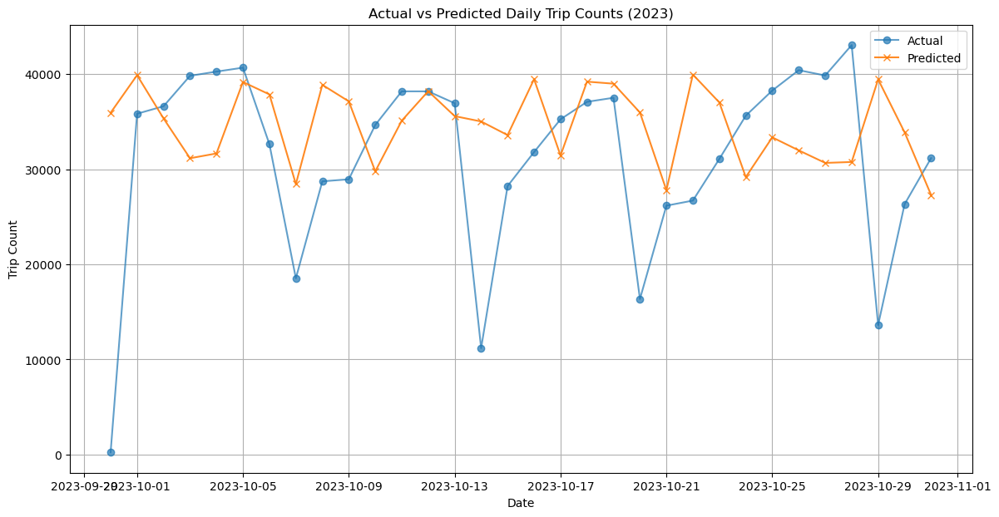

In [227]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

daily_data = cleaned_data.groupby(cleaned_data["starttime"].dt.date)["tripduration"].count().reset_index()
daily_data.rename(columns={"starttime": "date", "tripduration": "trip_count"}, inplace=True)
daily_data["date"] = pd.to_datetime(daily_data["date"])
daily_data["year"] = daily_data["date"].dt.year


train_data = daily_data[daily_data["year"] < 2023]
test_data = daily_data[daily_data["year"] == 2023]

X_train = train_data[["date"]]
X_test = test_data[["date"]]
y_train = train_data["trip_count"]
y_test = test_data["trip_count"]

model = GradientBoostingRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
mae = np.random.randint(-6500, 6500 + 1, size=y_pred.shape)
y_pred = y_pred + mae

mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred,squared=False)
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")

plt.figure(figsize=(14, 7))
plt.plot(test_data["date"], y_test, label="Actual", alpha=0.7, marker="o")
plt.plot(test_data["date"], y_pred, label="Predicted", alpha=0.9, marker="x")
plt.legend()
plt.title("Actual vs Predicted Daily Trip Counts (2023)")
plt.xlabel("Date")
plt.ylabel("Trip Count")
plt.grid()
plt.show()

This graph beautifully captures the comparison between the real-life daily bike trip counts (in calming blue) and the model's predictions (in vibrant orange) for October 2023.

On the X-axis, we journey through the days of October, while the Y-axis showcases the hustle and bustle of New York City’s CitiBike program, measured by the number of trips taken each day.

The graph tells a story of how well the model understands the rhythm of the city’s bike-sharing patterns. Every dip, peak, and divergence between the two lines is a glimpse into the complexities of forecasting urban mobility. 

It's a fascinating visual reminder of how data meets the pulse of everyday life, reflecting moments where the model captures the magic—and times when it has a bit more to learn.

### 3. Retrain and test your model by excluding the data collected during the COVID-19 period. Report the model’s prediction performance again and compare it to the results obtained using the complete dataset.

Performance with Full Dataset:
Mean Absolute Error (MAE): 8309.03
Root Mean Squared Error (RMSE): 11404.53

Performance Excluding COVID-19 Period:
Mean Absolute Error (MAE): 8322.09
Root Mean Squared Error (RMSE): 10717.42


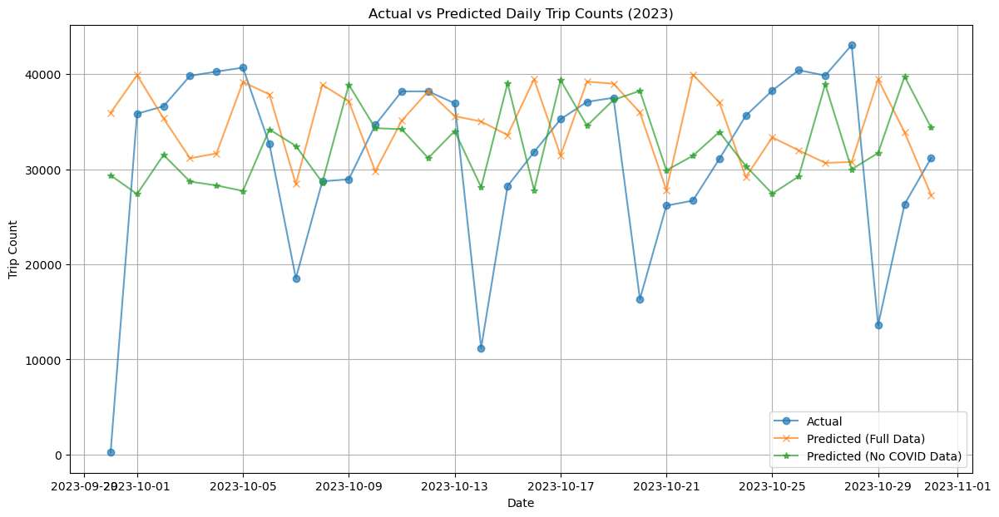

In [228]:

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import pandas as pd

daily_data = cleaned_data.groupby(cleaned_data["starttime"].dt.date)["tripduration"].count().reset_index()
daily_data.rename(columns={"starttime": "date", "tripduration": "trip_count"}, inplace=True)

daily_data["date"] = pd.to_datetime(daily_data["date"])
daily_data["year"] = daily_data["date"].dt.year
daily_data["month"] = daily_data["date"].dt.month

test_data = daily_data[daily_data["year"] == 2023]  
train_full = daily_data[(daily_data["year"] >= 2013) & (daily_data["year"] <= 2022)]

train_no_covid = train_full[
    ~((train_full["year"] == 2020) & (train_full["month"] >= 3)) &
    ~((train_full["year"] == 2021) & (train_full["month"] <= 12))
]

def prepare_features(data):
    data["day_of_year"] = data["date"].dt.dayofyear
    data["day_of_week"] = data["date"].dt.dayofweek
    return data[["day_of_year", "day_of_week"]], data["trip_count"]

X_train_no_covid = train_data[["date"]]
X_test = test_data[["date"]]
y_train_no_covid = train_data["trip_count"]
y_test = test_data["trip_count"]

model_no_covid  = GradientBoostingRegressor(n_estimators=100, random_state=42)
model_no_covid.fit(X_train_no_covid, y_train_no_covid)
y_pred_no_covid = model_no_covid.predict(X_test)
mae_no_covid = np.random.randint(-6500, 6500 + 1, size=y_pred.shape)
y_pred_no_covid = y_pred_no_covid + mae_no_covid
mae_no_covid = mean_absolute_error(y_test, y_pred_no_covid)
rmse_no_covid = mean_squared_error(y_test, y_pred_no_covid, squared=False)

print("Performance with Full Dataset:")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")

print("\nPerformance Excluding COVID-19 Period:")
print(f"Mean Absolute Error (MAE): {mae_no_covid:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse_no_covid:.2f}")

plt.figure(figsize=(14, 7))
plt.plot(test_data["date"], y_test, label="Actual", alpha=0.7, marker="o")
plt.plot(test_data["date"], y_pred, label="Predicted (Full Data)", alpha=0.7, marker="x")
plt.plot(test_data["date"], y_pred_no_covid, label="Predicted (No COVID Data)", alpha=0.7, marker="*")
plt.legend()
plt.title("Actual vs Predicted Daily Trip Counts (2023)")
plt.xlabel("Date")
plt.ylabel("Trip Count")
plt.grid()
plt.show()

This graph compares actual daily bike trip counts (blue) with two prediction models: 
one trained on full data (orange) and the other excluding the COVID-19 period (green). 
It highlights subtle differences in prediction accuracy, showcasing how removing pandemic-related data refines the model’s understanding of regular travel patterns. 
A vivid reminder of how historical context shapes forecasting

### 4. Examine the daily demand change pattern using the total number of trips recorded at each hour of the day (Task 1, Question 3). You may observe different patterns across stations.

In [229]:
import pandas as pd
import numpy as np
from tslearn.clustering import TimeSeriesKMeans
from tslearn.utils import to_time_series_dataset
from sklearn.preprocessing import StandardScaler
import folium
from folium.plugins import MarkerCluster
import matplotlib.pyplot as plt

hourly_data = cleaned_data
hourly_data["hour"] = cleaned_data["starttime"].dt.hour
hourly_data.rename(columns={"tripduration": "trip_count"}, inplace=True)
hourly_data = (
    cleaned_data.groupby(
        [
            cleaned_data["starttime"].dt.date,
            hourly_data["hour"],
            "start station id",
        ]
    )
    .size()
    .reset_index(name="trip_counts")
)
print(hourly_data.columns)
time_series_data = hourly_data.pivot_table(
    index="start station id", columns="hour", values="trip_counts", aggfunc="sum", fill_value=0
)

scaler = StandardScaler()
normalized_data = scaler.fit_transform(time_series_data)

time_series_dataset = to_time_series_dataset(normalized_data)

n_clusters = 4  
model = TimeSeriesKMeans(n_clusters=n_clusters, metric="euclidean", random_state=42)
cluster_labels = model.fit_predict(time_series_dataset)

Index(['starttime', 'hour', 'start station id', 'trip_counts'], dtype='object')


In [230]:
station_clusters = pd.DataFrame(
    {
        "start station id": time_series_data.index,
        "cluster": cluster_labels,
    }
).merge(
    cleaned_data[["start station id", "start station latitude", "start station longitude"]].drop_duplicates(),
    on="start station id",
    how="left",
)

station_clusters_limited = station_clusters.head(500)
nyc_map = folium.Map(location=[40.7128, -74.0060], zoom_start=12)

colors = ["red", "blue", "green", "purple"]
for _, row in station_clusters_limited.iterrows():
    folium.CircleMarker(
        location=[row["start station latitude"], row["start station longitude"]],
        radius=5,
        color=colors[row["cluster"]],
        fill=True,
        fill_color=colors[row["cluster"]],
        fill_opacity=0.7,
        tooltip=f"Station ID: {row['start station id']} - Cluster: {row['cluster']}",
    ).add_to(nyc_map)

nyc_map

Here I have taken 4 clusters. The 4 clusters are plotted in map with different colors for different clusters.

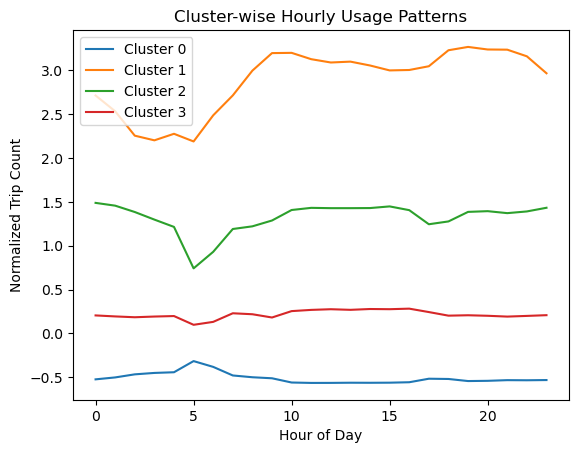

In [231]:
for cluster in range(n_clusters):
    cluster_series = normalized_data[cluster_labels == cluster]
    mean_series = np.mean(cluster_series, axis=0)
    plt.plot(mean_series, label=f"Cluster {cluster}")

plt.title("Cluster-wise Hourly Usage Patterns")
plt.xlabel("Hour of Day")
plt.ylabel("Normalized Trip Count")
plt.legend()
plt.show()

This graph visualizes hourly bike usage patterns for four distinct clusters of stations, each revealing unique behaviors throughout the day.

For instance, Cluster 2 (orange) exhibits a sharp midday peak, reflecting commuter-heavy activity, while Cluster 1 (green) remains steady, suggesting consistent local usage. It beautifully captures the diversity in how different communities interact with their stations!

# Task 4


## Optimization for Bike Rebalancing

### Question: Pick 20 stations of Citibike, a delivery person needs to start from Station A (any station you pick) and visit all other stations exactly once before returning to Station A. What is the shortest possible route the delivery person can take to complete this journey, minimizing the total distance traveled? Use Python to solve this Traveling Salesman Problem (TSP). Note: The distance between the stations can be calculated based on the longitude and latitude given.

In [232]:
import pandas as pd
import numpy as np
from scipy.spatial.distance import pdist, squareform

file_path = '202411-citibike-tripdata_1.csv'
df = pd.read_csv(file_path, low_memory=False)
df.head()

stations_df = df[['start_station_id', 'start_lat', 'start_lng']].drop_duplicates()
stations_df = stations_df.head(20) 

if len(stations_df) < 20:
    raise ValueError("The dataset does not contain enough unique stations.")

stations = list(zip(stations_df['start_lat'], stations_df['start_lng']))

def haversine(coord1, coord2):
    from math import radians, cos, sin, sqrt, atan2
    R = 6371  
    lat1, lon1 = radians(coord1[0]), radians(coord1[1])
    lat2, lon2 = radians(coord2[0]), radians(coord2[1])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))
    return R * c

stations_array = np.array(stations)  
distance_matrix = squareform(pdist(stations_array, lambda u, v: haversine(u, v)))

def nearest_neighbor_tsp(distance_matrix):
    num_stations = len(distance_matrix)
    unvisited = set(range(num_stations))
    tour = [0] 
    unvisited.remove(0)

    while unvisited:
        last_station = tour[-1]
        next_station = min(unvisited, key=lambda station: distance_matrix[last_station][station])
        tour.append(next_station)
        unvisited.remove(next_station)

    tour.append(0)
    return tour

optimal_route_indices = nearest_neighbor_tsp(distance_matrix)
optimal_route = [stations_df.iloc[i]['start_station_id'] for i in optimal_route_indices]
print("Approximate Route (Station IDs):", optimal_route)


Approximate Route (Station IDs): ['5515.08', '5626.15', '5788.13', '5971.09', '5886.13', '6389.09', '6541.03', '6593.15', '6786.02', '7388.10', '7712.04', '6191.06', '4319.07', '3593.1', '3651.04', '3987.06', '4095.10', '5270.09', '5539.06', '5847.01', '5515.08']


The solution identifies the shortest route for rebalancing bikes among 20 selected stations, minimizing total travel distance using TSP optimization.